In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
mkdir ~/.kaggle/

In [ ]:
cp '/content/drive/MyDrive/kaggle.json' ~/.kaggle/

In [ ]:
!chmod 100 ~/.kaggle/kaggle.json

In [ ]:
! kaggle competitions download deepfake-detection-challenge

100% 4.13G/4.13G [00:50<00:00, 123MB/s]
100% 4.13G/4.13G [00:50<00:00, 87.4MB/s]


In [ ]:
! unzip /content/deepfake-detection-challenge.zip -d deepfake-detection-challenge

Archive:  /content/deepfake-detection-challenge.zip
  inflating: deepfake-detection-challenge/sample_submission.csv  
  inflating: deepfake-detection-challenge/test_videos/aassnaulhq.mp4  
  inflating: deepfake-detection-challenge/test_videos/aayfryxljh.mp4  
  inflating: deepfake-detection-challenge/test_videos/acazlolrpz.mp4  
  inflating: deepfake-detection-challenge/test_videos/adohdulfwb.mp4  
  inflating: deepfake-detection-challenge/test_videos/ahjnxtiamx.mp4  
  inflating: deepfake-detection-challenge/test_videos/ajiyrjfyzp.mp4  
  inflating: deepfake-detection-challenge/test_videos/aktnlyqpah.mp4  
  inflating: deepfake-detection-challenge/test_videos/alrtntfxtd.mp4  
  inflating: deepfake-detection-challenge/test_videos/aomqqjipcp.mp4  
  inflating: deepfake-detection-challenge/test_videos/apedduehoy.mp4  
  inflating: deepfake-detection-challenge/test_videos/apvzjkvnwn.mp4  
  inflating: deepfake-detection-challenge/test_videos/aqrsylrzgi.mp4  
  inflating: deepfake-detectio

In [ ]:
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

In [ ]:
import sys
import sklearn
import tensorflow as tf

import cv2
import pandas as pd
import numpy as np

import plotly.graph_objs as go
from plotly.offline import iplot
from matplotlib import pyplot as plt

In [ ]:
plt.rc('font', size=14)
plt.rc('axes', labelsize=14, titlesize=14)
plt.rc('legend', fontsize=14)
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)

In [ ]:
DATA_FOLDER = '../content/deepfake-detection-challenge'
TRAIN_SAMPLE_FOLDER = 'train_sample_videos'
TEST_FOLDER = 'test_videos'

print(f"Train samples: {len(os.listdir(os.path.join(DATA_FOLDER, TRAIN_SAMPLE_FOLDER)))}")
print(f"Test samples: {len(os.listdir(os.path.join(DATA_FOLDER, TEST_FOLDER)))}")

train_sample_metadata = pd.read_json('../content/deepfake-detection-challenge/train_sample_videos/metadata.json').T
train_sample_metadata.head(10)



Train samples: 401
Test samples: 400


,label,split,original
aagfhgtpmv.mp4,FAKE,train,vudstovrck.mp4
aapnvogymq.mp4,FAKE,train,jdubbvfswz.mp4
abarnvbtwb.mp4,REAL,train,None
abofeumbvv.mp4,FAKE,train,atvmxvwyns.mp4
abqwwspghj.mp4,FAKE,train,qzimuostzz.mp4
acifjvzvpm.mp4,FAKE,train,kbvibjhfzo.mp4
acqfdwsrhi.mp4,FAKE,train,ccfoszqabv.mp4
acxnxvbsxk.mp4,FAKE,train,fjlyaizcwc.mp4
acxwigylke.mp4,FAKE,train,ffcwhpnpuw.mp4
aczrgyricp.mp4,FAKE,train,slwkmefgde.mp4


from matplotlib import pyplot as plt
import seaborn as sns
_df_0.groupby('label').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

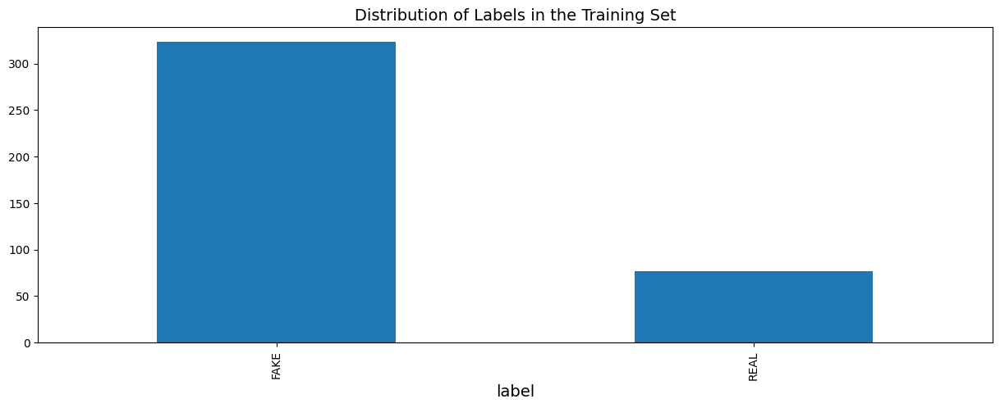

['dgmevclvzy.mp4',
 'cepxysienc.mp4',
 'bqdjzqhcft.mp4',
 'aettqgevhz.mp4',
 'eukvucdetx.mp4',
 'asdpeebotb.mp4',
 'bmjmjmbglm.mp4',
 'diopzaywor.mp4',
 'aneclqfpbt.mp4',
 'bhsluedavd.mp4']

In [ ]:
train_sample_metadata.groupby('label')['label'].count().plot(figsize=(15, 5), kind='bar', title='Distribution of Labels in the Training Set')
plt.show()

train_sample_metadata.shape

fake_train_sample_video = list(train_sample_metadata.loc[train_sample_metadata.label=='FAKE'].sample(10).index)
fake_train_sample_video

original
atvmxvwyns.mp4    6
meawmsgiti.mp4    6
qeumxirsme.mp4    5
kgbkktcjxf.mp4    5
fysyrqfguw.mp4    4
gjypopglvi.mp4    4
dzyuwjkjui.mp4    4
gipbyjfxfp.mp4    4
ywvlvpvroj.mp4    4
qtnjyomzwo.mp4    4
Name: count, dtype: int64

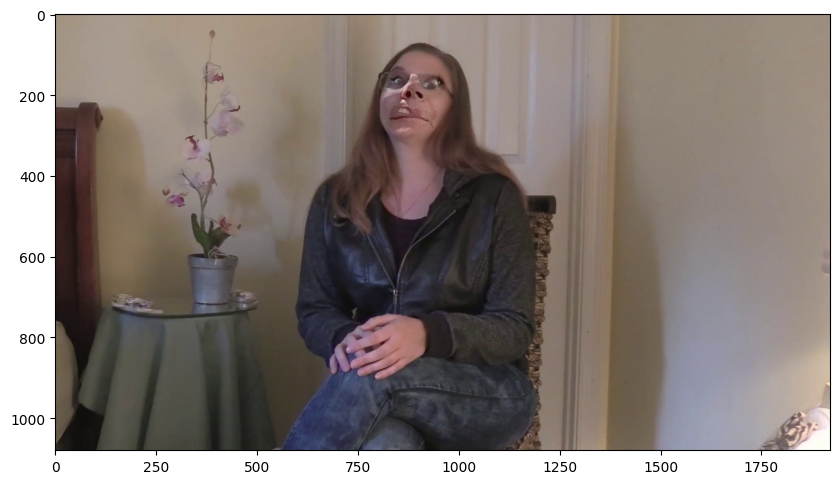

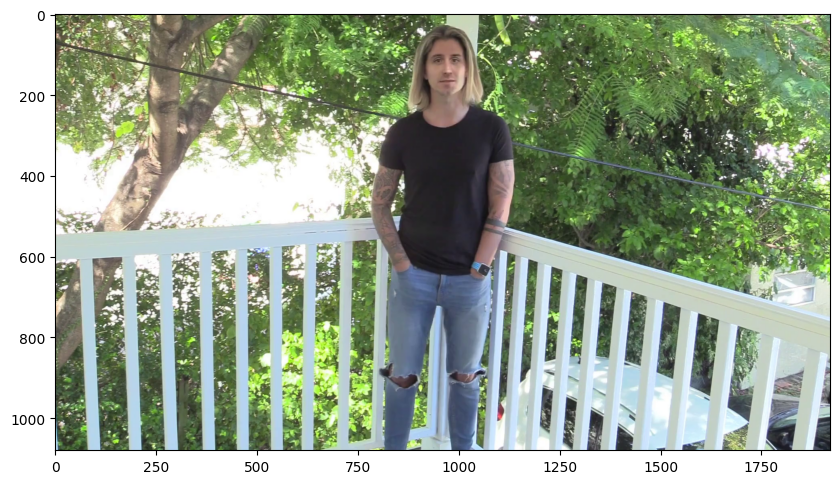

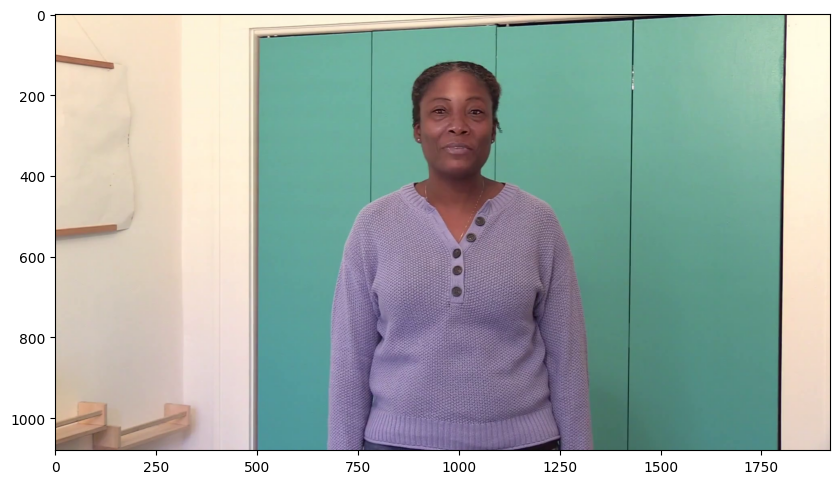

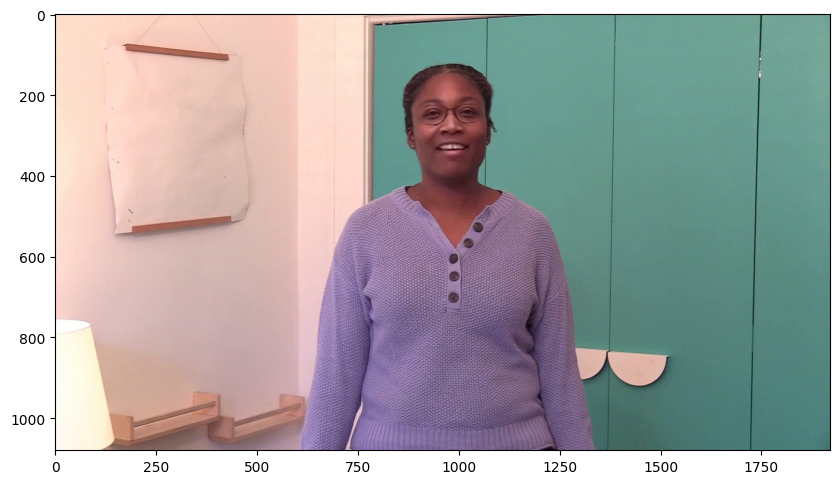

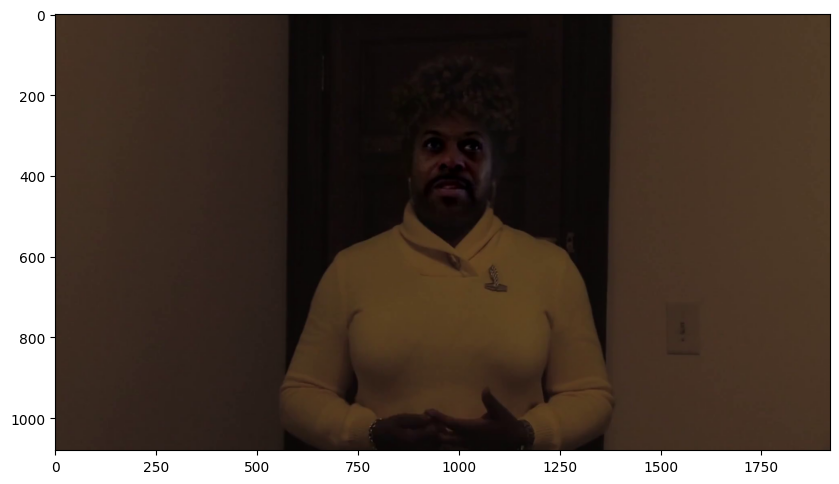

...

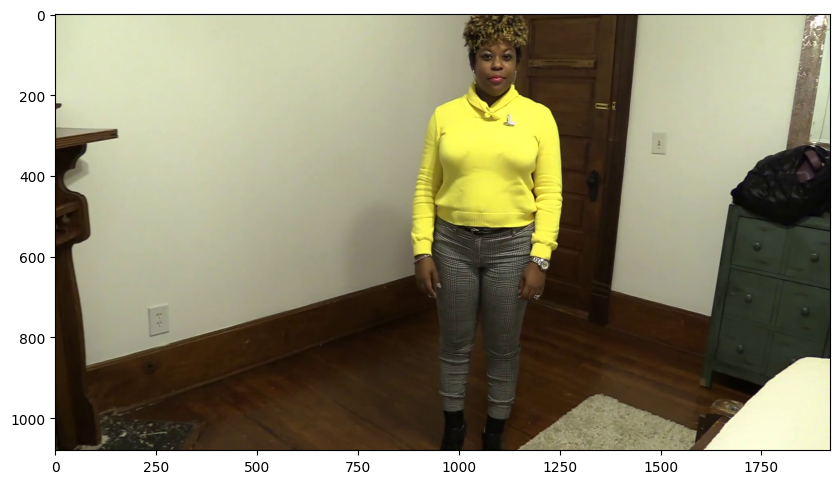

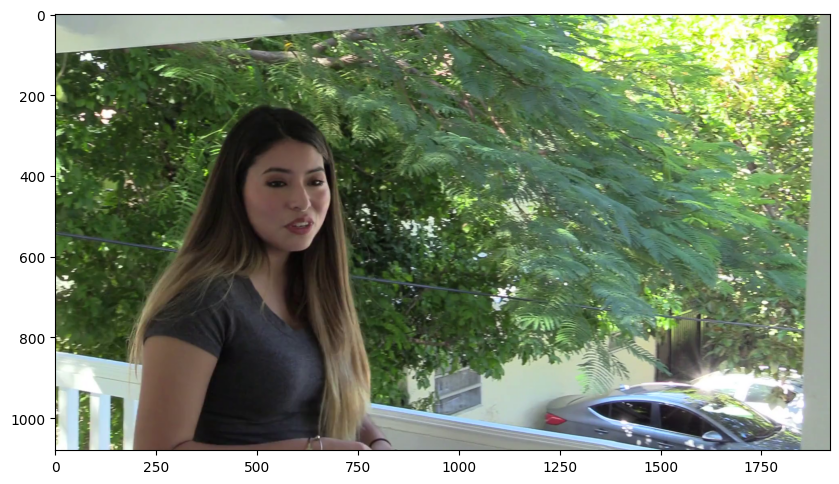

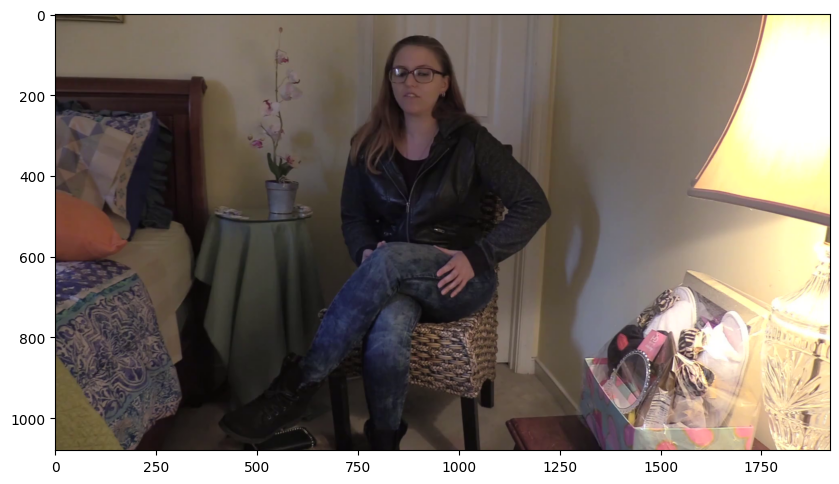

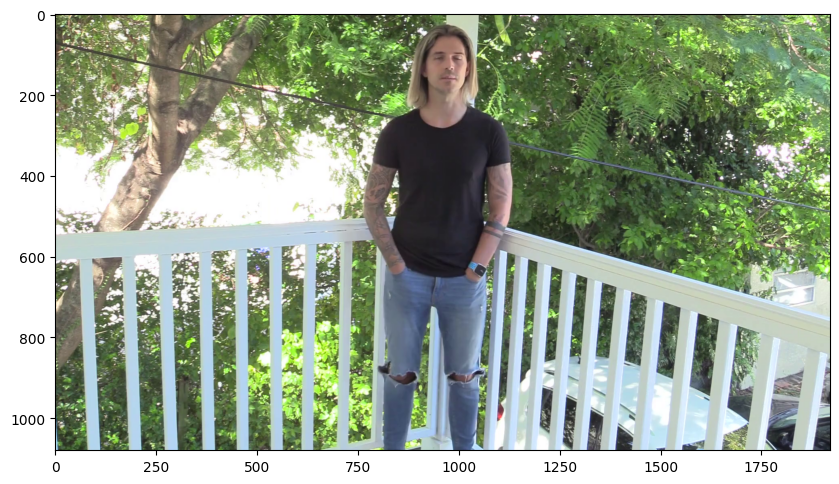

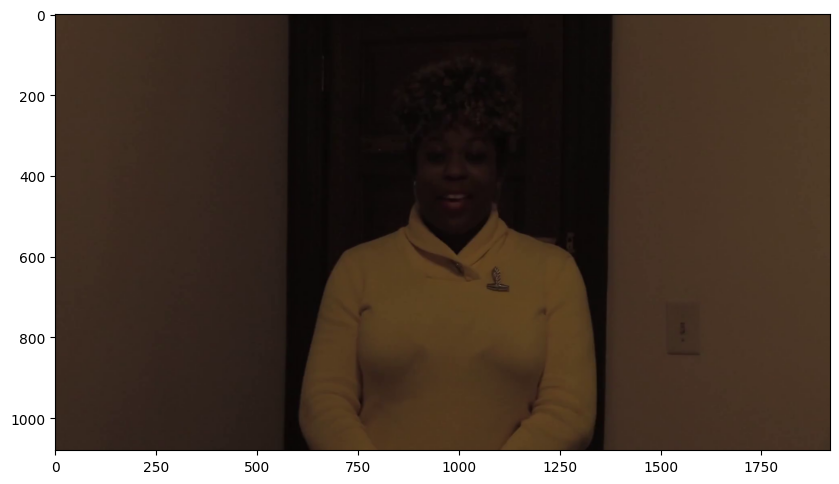

In [ ]:
def display_image_from_video(video_path):
    capture_image = cv2.VideoCapture(video_path)
    ret, frame = capture_image.read()
    fig = plt.figure(figsize=(10,10))
    ax = fig.add_subplot(111)
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    ax.imshow(frame)

for video_file in fake_train_sample_video:
    display_image_from_video(os.path.join(DATA_FOLDER, TRAIN_SAMPLE_FOLDER, video_file))

real_train_sample_video = list(train_sample_metadata.loc[train_sample_metadata.label=='REAL'].sample(10).index)
real_train_sample_video

for video_file in real_train_sample_video:
    display_image_from_video(os.path.join(DATA_FOLDER, TRAIN_SAMPLE_FOLDER, video_file))

train_sample_metadata['original'].value_counts()[0:10]


<Figure size 640x480 with 0 Axes>

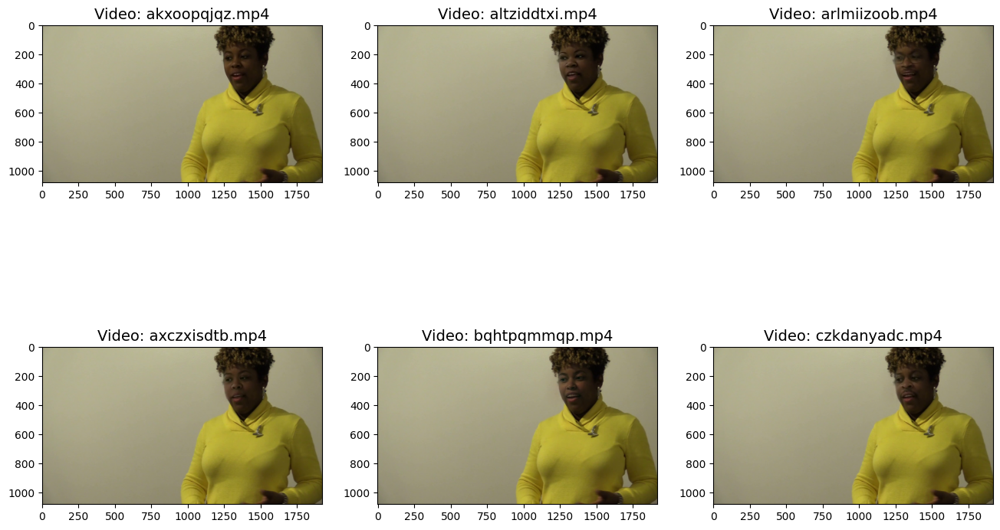

In [ ]:
def display_image_from_video_list(video_path_list, video_folder=TRAIN_SAMPLE_FOLDER):
    plt.figure()
    fig, ax = plt.subplots(2,3,figsize=(16,10))
    for i, video_file in enumerate(video_path_list[0:10]):
        video_path = os.path.join(DATA_FOLDER, video_folder,video_file)
        capture_image = cv2.VideoCapture(video_path)
        ret, frame = capture_image.read()
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        ax[i//3, i%3].imshow(frame)
        ax[i//3, i%3].set_title(f"Video: {video_file}")
        ax[i//3, i%3].axis('on')

same_original_fake_train_sample_video = list(train_sample_metadata.loc[train_sample_metadata.original=='meawmsgiti.mp4'].index)
display_image_from_video_list(same_original_fake_train_sample_video)

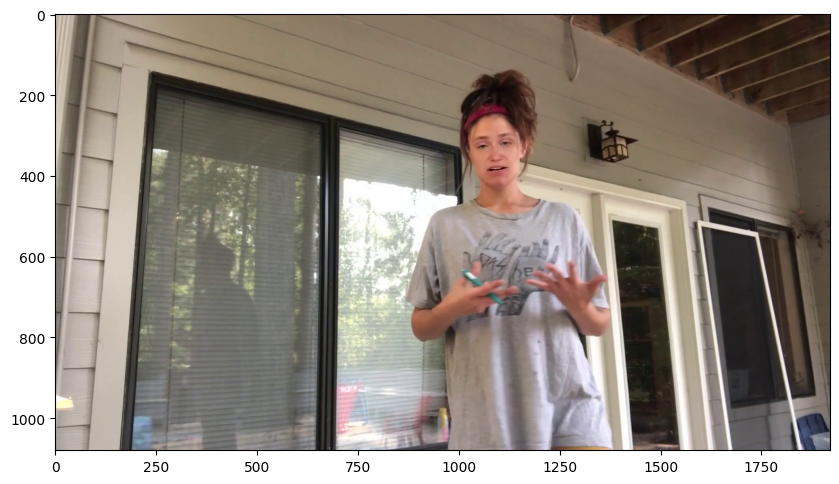

In [ ]:
test_videos = pd.DataFrame(list(os.listdir(os.path.join(DATA_FOLDER, TEST_FOLDER))), columns=['video'])

test_videos.head(10)

display_image_from_video(os.path.join(DATA_FOLDER, TEST_FOLDER, test_videos.iloc[35].video))

fake_videos = list(train_sample_metadata.loc[train_sample_metadata.label=='FAKE'].index)


In [ ]:
from IPython.display import HTML
from base64 import b64encode

def play_video(video_file, subset=TRAIN_SAMPLE_FOLDER):
    video_url = open(os.path.join(DATA_FOLDER, subset,video_file),'rb').read()
    data_url = "data:video/mp4;base64," + b64encode(video_url).decode()
    return HTML("""<video width=500 controls><source src="%s" type="video/mp4"></video>""" % data_url)

play_video(fake_videos[20])

In [ ]:
IMG_SIZE = 224
BATCH_SIZE = 64
EPOCHS = 10

MAX_SEQ_LENGTH = 20
NUM_FEATURES = 2048
OPTICAL_FLOW_FEATURES = 1  # Optical flow has 1 feature (average displacement magnitude)
COLOR_HISTOGRAM_BINS = 512 # Number of bins for color histogram
MAX_FRAMES = 10

In [ ]:
def crop_center_square(frame):
    y, x = frame.shape[0:2]
    min_dim = min(y, x)
    start_x = (x // 2) - (min_dim // 2)
    start_y = (y // 2) - (min_dim // 2)
    return frame[start_y: start_y + min_dim, start_x: start_x + min_dim]

In [ ]:
def build_feature_extractor():
    feature_extractor = InceptionV3(
        weights="imagenet",
        include_top=False,
        pooling="avg",
        input_shape=(IMG_SIZE, IMG_SIZE, 3),
    )
    preprocess_input = keras.applications.inception_v3.preprocess_input

    inputs = keras.Input((IMG_SIZE, IMG_SIZE, 3))
    preprocessed = preprocess_input(inputs)

    outputs = feature_extractor(preprocessed)
    return keras.Model(inputs, outputs, name="feature_extractor")

In [ ]:
import random
import keras
from keras.applications import InceptionV3

In [ ]:
def calculate_optical_flow(prev_frame, curr_frame):
    prev_gray = cv2.cvtColor(prev_frame, cv2.COLOR_BGR2GRAY)
    curr_gray = cv2.cvtColor(curr_frame, cv2.COLOR_BGR2GRAY)

    # Calculate optical flow using Farneback method
    flow = cv2.calcOpticalFlowFarneback(prev_gray, curr_gray, None, 0.5, 3, 15, 3, 5, 1.2, 0)

    # Calculate displacement magnitude
    magnitude = np.sqrt(flow[..., 0] ** 2 + flow[..., 1] ** 2)

    # Calculate average displacement magnitude
    avg_magnitude = np.mean(magnitude)
    return avg_magnitude

In [ ]:
# Function to calculate entropy from the grayscale histogram of a frame
def calculate_entropy(frame):
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    hist = cv2.calcHist([gray], [0], None, [256], [0, 256])
    hist /= hist.sum()
    entropy = -np.sum(hist * np.log2(hist + 1e-6))
    return entropy

In [ ]:
# Function to calculate color histogram features of a frame
def calculate_color_histogram(frame):
    hist = cv2.calcHist([frame], [0, 1, 2], None, [8, 8, 8], [0, 256, 0, 256, 0, 256])
    hist /= hist.sum()
    return hist.flatten()

Selected random video: ../content/deepfake-detection-challenge/train_sample_videos/bwuwstvsbw.mp4
Total number of frames in the video: 300
Number of frames processed: 300


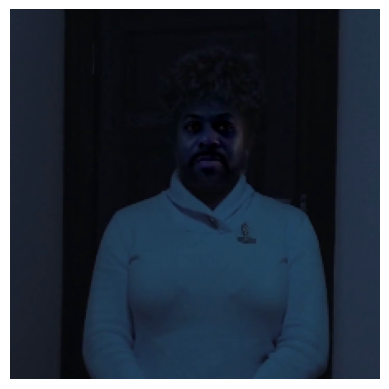

87910968/87910968 [==============================] - 1s 0us/step


In [ ]:
import random
import keras
from keras.applications import InceptionV3
def load_video(path, max_frames=None, resize=(IMG_SIZE, IMG_SIZE)):
    cap = cv2.VideoCapture(path_to_random_video)
    frames = []

    if not cap.isOpened():
        raise Exception(f"Error opening video file: {path_to_random_video}")

    try:
        frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        print(f"Total number of frames in the video: {frame_count}")

        for frame_num in range(frame_count):
            ret, frame = cap.read()

            if not ret:
                raise Exception("Error reading frame from video")

            frame = crop_center_square(frame)
            frame = cv2.resize(frame, resize)
            frame = frame[:, :, [2, 1, 0]]  # Convert BGR to RGB
            frames.append(frame)

            if max_frames is not None and len(frames) >= max_frames:
                break

        print(f"Number of frames processed: {len(frames)}")

    except Exception as e:
        print(f"Error processing video: {e}")
    finally:
        cap.release()

    return np.array(frames)

# Load the video frames
def select_random_video(directory):
    video_files = [f for f in os.listdir(directory) if f.endswith('.mp4')]
    if not video_files:
        raise ValueError("No video files found in the directory")
    return os.path.join(directory, random.choice(video_files))

# Directory containing video files
video_directory = "../content/deepfake-detection-challenge/train_sample_videos"
# Select a random video file
path_to_random_video = select_random_video(video_directory)
print("Selected random video:", path_to_random_video)

# Load the random video frames
frames = load_video(path_to_random_video)

# Visualize the first frame
if len(frames) > 0:
    first_frame = crop_center_square(frames[0])
    plt.imshow(cv2.cvtColor(first_frame, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

# Build the feature extractor
feature_extractor = build_feature_extractor()

In [ ]:
def prepare_all_videos(df, root_dir):
    num_samples = len(df)
    video_paths = list(df.index)
    labels = df["label"].values
    labels = np.array(labels=='FAKE').astype(int)
    frame_masks = np.zeros(shape=(num_samples, MAX_SEQ_LENGTH), dtype="bool")
    frame_features = np.zeros(
        shape=(num_samples, MAX_SEQ_LENGTH, NUM_FEATURES + OPTICAL_FLOW_FEATURES + 1 + COLOR_HISTOGRAM_BINS), dtype="float32"
    )

    for idx, path in enumerate(video_paths):
        frames = load_video(os.path.join(root_dir, path))
        frames = frames[None, ...]
        temp_frame_mask = np.zeros(shape=(1, MAX_SEQ_LENGTH,), dtype="bool")
        temp_frame_features = np.zeros(
            shape=(1, MAX_SEQ_LENGTH, NUM_FEATURES + OPTICAL_FLOW_FEATURES + 1 + COLOR_HISTOGRAM_BINS), dtype="float32"
        )

        prev_frame = frames[0]
        for i, batch in enumerate(frames):
            video_length = batch.shape[0]
            length = min(MAX_SEQ_LENGTH, video_length)
            for j in range(length):
                temp_frame_features[i, j, :NUM_FEATURES] = feature_extractor.predict(
                    batch[None, j, :]
                )
                if j > 0:
                    optical_flow = calculate_optical_flow(prev_frame, batch[j])
                    temp_frame_features[i, j, NUM_FEATURES] = optical_flow
                    print("Optical Flow:", optical_flow)
                prev_frame = batch[j]
                entropy_value = calculate_entropy(batch[j])
                temp_frame_features[i, j, NUM_FEATURES + 1] = entropy_value
                print("Entropy:", entropy_value)
                histogram = calculate_color_histogram(batch[j])
                temp_frame_features[i, j, NUM_FEATURES + 2:] = histogram
                print("Color Histogram:")
                print(histogram)

            temp_frame_mask[i, :length] = 1

        frame_features[idx,] = temp_frame_features.squeeze()
        frame_masks[idx,] = temp_frame_mask.squeeze()

    return (frame_features, frame_masks), labels


In [ ]:
from sklearn.model_selection import train_test_split
train_set, test_set = train_test_split(train_sample_metadata, test_size=0.2, random_state=42, stratify=train_sample_metadata['label'])
train_data, train_labels = prepare_all_videos(train_set, "train_sample_videos")
test_data, test_labels = prepare_all_videos(test_set, "test")

Streaming output truncated to the last 5000 lines.
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00]
1/1 [==============================] - 0s 141ms/step
Optical Flow: 0.059457377
Entropy: 5.1917915
Color Histogram:
[4.2113760e-01 1.9929847e-05 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.000000

# **CNN**

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping

frame_features_input = keras.Input((MAX_SEQ_LENGTH, NUM_FEATURES + OPTICAL_FLOW_FEATURES + 1 + COLOR_HISTOGRAM_BINS,1))
mask_input = keras.Input((MAX_SEQ_LENGTH,), dtype="bool")

x = keras.layers.Conv2D(32, kernel_size=3, activation='relu', padding='same')(frame_features_input)
x = keras.layers.Conv2D(32, kernel_size=3, activation='relu', padding='same')(x)
x = keras.layers.MaxPooling2D(pool_size=2)(x)

x = keras.layers.Conv2D(64, kernel_size=3, activation='relu', padding='same')(x)
x = keras.layers.Conv2D(64, kernel_size=3, activation='relu', padding='same')(x)
x = keras.layers.MaxPooling2D(pool_size=2)(x)

x = keras.layers.Conv2D(128, kernel_size=3, activation='relu', padding='same')(x)
x = keras.layers.Conv2D(128, kernel_size=3, activation='relu', padding='same')(x)
x = keras.layers.MaxPooling2D(pool_size=2)(x)

x = keras.layers.Flatten()(x)

x = keras.layers.Dense(128, activation="relu")(x)
x = keras.layers.Dropout(0.5)(x)
x = keras.layers.Dense(64, activation="relu")(x)

output = keras.layers.Dense(1, activation="sigmoid")(x)

model = keras.Model([frame_features_input, mask_input], output)

In [ ]:
# Compile the model
model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])
early_stopping = EarlyStopping(monitor='val_accuracy', patience=5, restore_best_weights=True)


# Train the model
history = model.fit(
    [train_data[0], train_data[1]],
    train_labels,
    validation_data=([test_data[0], test_data[1]], test_labels),
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    callbacks=[early_stopping]
)

test_loss, test_accuracy = model.evaluate([test_data[

0], test_data[1]], test_labels)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

Epoch 1/10
5/5 [==============================] - 111s 22s/step - loss: 0.6592 - accuracy: 0.8062 - val_loss: 0.6343 - val_accuracy: 0.8125
Epoch 2/10
5/5 [==============================] - 106s 22s/step - loss: 0.5754 - accuracy: 0.8062 - val_loss: 0.5117 - val_accuracy: 0.8125
Epoch 3/10
5/5 [==============================] - 112s 22s/step - loss: 0.5286 - accuracy: 0.8062 - val_loss: 0.5366 - val_accuracy: 0.8125
Epoch 4/10
5/5 [==============================] - 110s 23s/step - loss: 0.5101 - accuracy: 0.8062 - val_loss: 0.4841 - val_accuracy: 0.8125
Epoch 5/10
5/5 [==============================] - 112s 23s/step - loss: 0.5127 - accuracy: 0.8062 - val_loss: 0.4904 - val_accuracy: 0.8125
Epoch 6/10
3/3 [==============================] - 7s 2s/step - loss: 0.6343 - accuracy: 0.8125
Test Loss: 0.6342668533325195
Test Accuracy: 0.8125


Evaluation for Frame Features CNN Model:
3/3 [==============================] - 8s 3s/step
Accuracy: 0.8125
Precision: 0.8125
Recall: 1.0
F1 Score: 0.896551724137931
AUC-ROC Score: 0.5


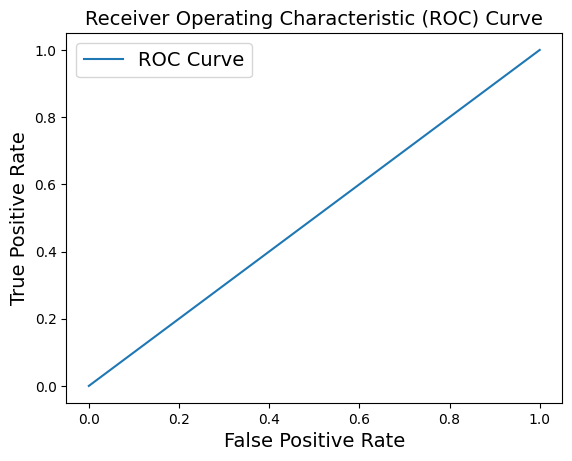

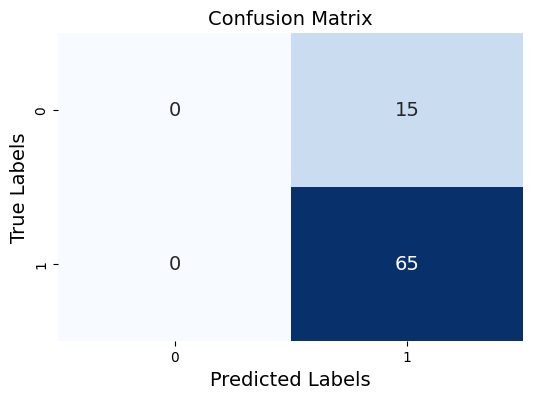

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, confusion_matrix
import numpy as np
import seaborn as sns

# Define a function to evaluate a model and print its evaluation metrics
def evaluate_model(model, test_data, test_labels):
    # Make predictions
    predictions = model.predict(test_data)
    # Convert predictions to binary values (0 or 1)
    binary_predictions = np.round(predictions)

    # Calculate evaluation metrics
    accuracy = accuracy_score(test_labels, binary_predictions)
    precision = precision_score(test_labels, binary_predictions)
    recall = recall_score(test_labels, binary_predictions)
    f1 = f1_score(test_labels, binary_predictions)
    auc_roc = roc_auc_score(test_labels, predictions)

    # Print evaluation metrics
    print("Accuracy:", accuracy)
    print("Precision:", precision)
    print("Recall:", recall)
    print("F1 Score:", f1)
    print("AUC-ROC Score:", auc_roc)

    # Plot ROC curve
    fpr, tpr, thresholds = roc_curve(test_labels, predictions)
    plt.plot(fpr, tpr, label='ROC Curve')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend()
    plt.show()

    # Plot confusion matrix
    cm = confusion_matrix(test_labels, binary_predictions)
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt='g', cmap='Blues', cbar=False)
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.title('Confusion Matrix')
    plt.show()

# Evaluate Frame Features CNN Model
print("Evaluation for Frame Features CNN Model:")
evaluate_model(model, [test_data[0], test_data[1]], test_labels)


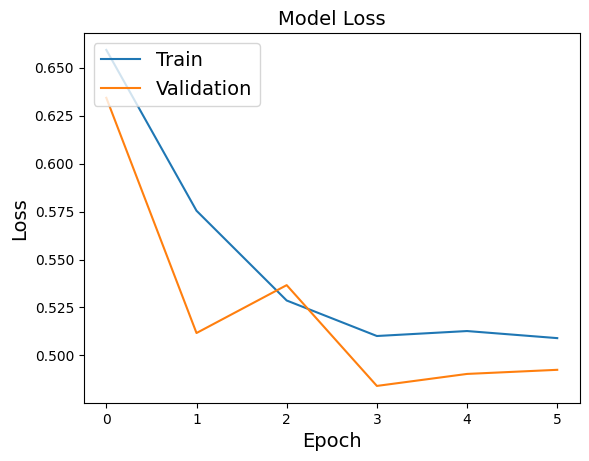

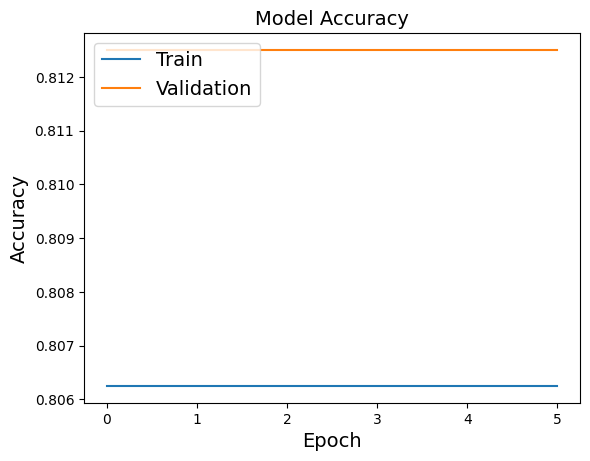

In [ ]:
import matplotlib.pyplot as plt

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

import matplotlib.pyplot as plt

# Plot training & validation accuracy values
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# **VGG16**

Shape of resized_train_data[0]: (224, 224, 3)
Shape of resized_test_data[0]: (224, 224, 3)
(None, 224, 224, 3)
Epoch 1/10
5/5 [==============================] - 260s 54s/step - loss: 2.2300 - accuracy: 0.8062 - val_loss: 0.6744 - val_accuracy: 0.8125
Epoch 2/10
5/5 [==============================] - 248s 54s/step - loss: 0.6901 - accuracy: 0.4125 - val_loss: 0.6929 - val_accuracy: 0.8125
Epoch 3/10
5/5 [==============================] - 253s 55s/step - loss: 0.6925 - accuracy: 0.8062 - val_loss: 0.6918 - val_accuracy: 0.8125
Epoch 4/10
3/3 [==============================] - 6s 2s/step - loss: 0.6343 - accuracy: 0.8125
Test Loss: 0.6342668533325195
Test Accuracy: 0.8125


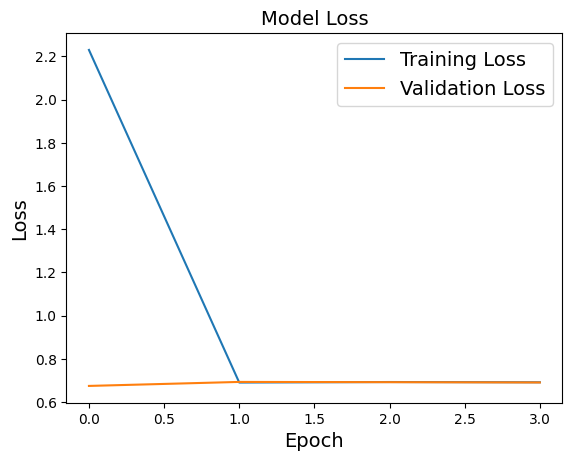

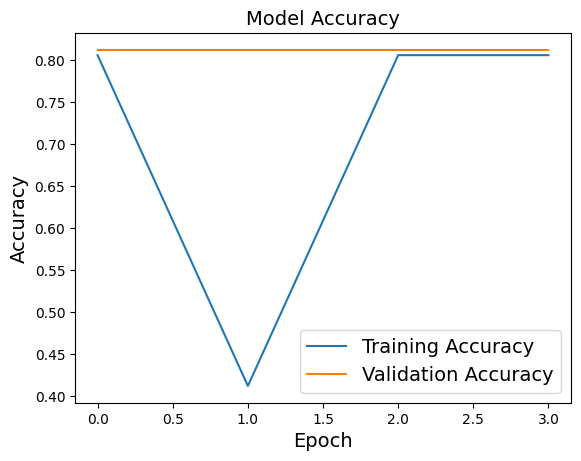

In [ ]:
import numpy as np
import cv2
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Flatten
from tensorflow.keras.applications import VGG16
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt


train_labels = np.array(train_labels)
test_labels = np.array(test_labels)

# Resize frame features to match the expected input shape (224, 224, 3)
resized_train_data = []
resized_test_data = []
for frame_features in train_data[0]:
    resized_frame = cv2.resize(frame_features, (224, 224))
    resized_frame = np.stack((resized_frame,) * 3, axis=-1)
    resized_train_data.append(resized_frame)

for frame_features in test_data[0]:
    resized_frame = cv2.resize(frame_features, (224, 224))  # Resize frame to (224, 224)
    resized_frame = np.stack((resized_frame,) * 3, axis=-1)
    resized_test_data.append(resized_frame)

resized_train_data = np.array(resized_train_data)
resized_test_data = np.array(resized_test_data)


# Convert resized_train_data to numpy array
# resized_train_data = np.expand_dims(resized_train_data, axis=-1)
# resized_test_data = np.expand_dims(resized_test_data, axis=-1)

# Verify the shape after adding the dimension
print(f"Shape of resized_train_data[0]: {resized_train_data[0].shape}")
print(f"Shape of resized_test_data[0]: {resized_test_data[0].shape}")


# Define VGG16 base model
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224,3))

# Freeze base model layers
base_model.trainable = False

# Add custom classification layers on top of VGG16
inputs = Input(shape=(224, 224,3))
x = base_model(inputs, training=False)
x = Flatten()(x)
x = Dense(256, activation='relu')(x)
outputs = Dense(1, activation='sigmoid')(x)

# Create the model
model_3 = Model(inputs, outputs)

# Compile the model
model_3.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])
print(model_3.input_shape)
early_stopping = EarlyStopping(monitor='val_accuracy', patience=3, restore_best_weights=True)

# Train the model
history = model_3.fit(
    resized_train_data,
    train_labels,
    validation_data=(resized_test_data, test_labels),
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    callbacks=[early_stopping]
)


test_loss, test_accuracy = model.evaluate([test_data[0], test_data[1]], test_labels)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

# Plot training & validation loss values
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot training & validation accuracy values
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()



Evaluation for Transfer Learning with VGG16 Model:
3/3 [==============================] - 42s 12s/step
Accuracy: 0.8125
Precision: 0.8125
Recall: 1.0
F1 Score: 0.896551724137931
AUC-ROC Score: 0.5


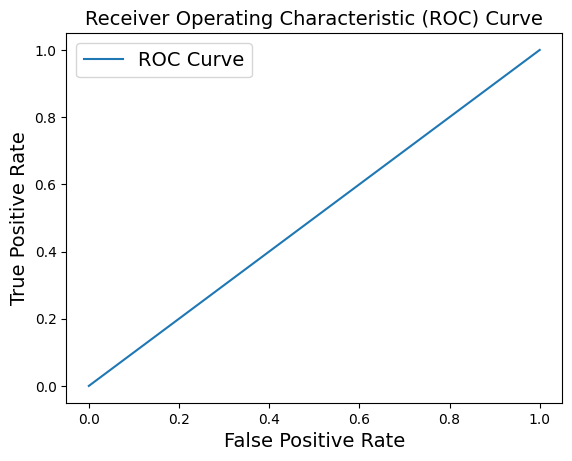

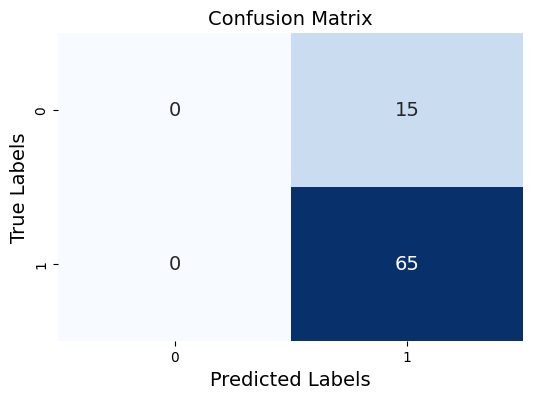

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, confusion_matrix
import numpy as np

# Define a function to evaluate a model and print its evaluation metrics
def evaluate_model(model_3, test_data, test_labels):
    # Make predictions
    predictions = model_3.predict(test_data)
    # Convert predictions to binary values (0 or 1)
    binary_predictions = np.round(predictions)

    # Calculate evaluation metrics
    accuracy = accuracy_score(test_labels, binary_predictions)
    precision = precision_score(test_labels, binary_predictions)
    recall = recall_score(test_labels, binary_predictions)
    f1 = f1_score(test_labels, binary_predictions)
    auc_roc = roc_auc_score(test_labels, predictions)

    # Print evaluation metrics
    print("Accuracy:", accuracy)
    print("Precision:", precision)
    print("Recall:", recall)
    print("F1 Score:", f1)
    print("AUC-ROC Score:", auc_roc)

    # Plot ROC curve
    fpr, tpr, thresholds = roc_curve(test_labels, predictions)
    plt.plot(fpr, tpr, label='ROC Curve')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend()
    plt.show()

    # Plot confusion matrix
    cm = confusion_matrix(test_labels, binary_predictions)
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt='g', cmap='Blues', cbar=False)
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.title('Confusion Matrix')
    plt.show()



# Evaluate Transfer Learning with VGG16 Model
print("\nEvaluation for Transfer Learning with VGG16 Model:")
evaluate_model(model_3, resized_test_data, test_labels)


# **Xception Network**

(None, 224, 224, 3)
Epoch 1/10
5/5 [==============================] - 108s 19s/step - loss: 19.8621 - accuracy: 0.6812 - val_loss: 12.2159 - val_accuracy: 0.8125
Epoch 2/10
5/5 [==============================] - 88s 19s/step - loss: 3.4325 - accuracy: 0.4563 - val_loss: 0.6933 - val_accuracy: 0.1875
Epoch 3/10
5/5 [==============================] - 87s 18s/step - loss: 0.6930 - accuracy: 0.5750 - val_loss: 0.6925 - val_accuracy: 0.8125
Epoch 4/10
3/3 [==============================] - 18s 5s/step - loss: 12.2159 - accuracy: 0.8125
Test Loss: 12.21592903137207
Test Accuracy: 0.8125


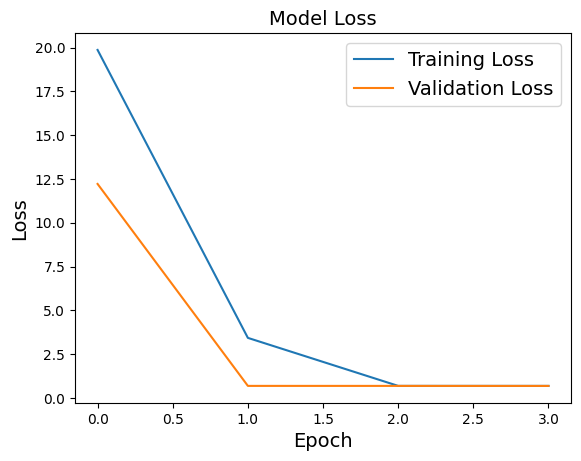

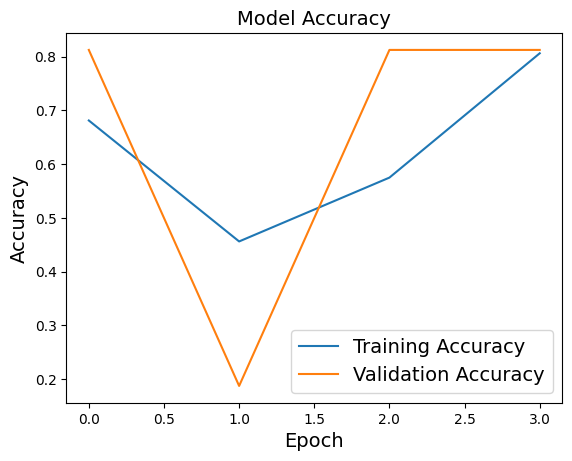

In [ ]:
import numpy as np
import cv2
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Flatten
from tensorflow.keras.applications import Xception
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt

# Assuming train_data[0] contains frame features and test_data[0] contains frame features

train_labels = np.array(train_labels)
test_labels = np.array(test_labels)

# Resize frame features to match the expected input shape (224, 224, 3)
resized_train_data = []
resized_test_data = []
for frame_features in train_data[0]:
    resized_frame = cv2.resize(frame_features, (224, 224))
    resized_frame = np.stack((resized_frame,) * 3, axis=-1)
    resized_train_data.append(resized_frame)

for frame_features in test_data[0]:
    resized_frame = cv2.resize(frame_features, (224, 224))  # Resize frame to (224, 224)
    resized_frame = np.stack((resized_frame,) * 3, axis=-1)
    resized_test_data.append(resized_frame)

resized_train_data = np.array(resized_train_data)
resized_test_data = np.array(resized_test_data)

# Define Xception base model
base_model = Xception(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze base model layers
base_model.trainable = False

# Add custom classification layers on top of Xception
inputs = Input(shape=(224, 224, 3))
x = base_model(inputs, training=False)
x = Flatten()(x)
x = Dense(256, activation='relu')(x)
outputs = Dense(1, activation='sigmoid')(x)

# Create the model
model_xception = Model(inputs, outputs)

# Compile the model
model_xception.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])
print(model_xception.input_shape)

early_stopping = EarlyStopping(monitor='val_accuracy', patience=3, restore_best_weights=True)


# Train the model
history = model_xception.fit(
    resized_train_data,
    train_labels,
    validation_data=(resized_test_data, test_labels),
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    callbacks=[early_stopping]
)

# Evaluate the model
test_loss, test_accuracy = model_xception.evaluate(resized_test_data, test_labels)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

# Plot training & validation loss values
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot training & validation accuracy values
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()



Evaluation for Transfer Learning with Xception Model:


3/3 [==============================] - 17s 5s/step
Accuracy: 0.8125
Precision: 0.8125
Recall: 1.0
F1 Score: 0.896551724137931
AUC-ROC Score: 0.5


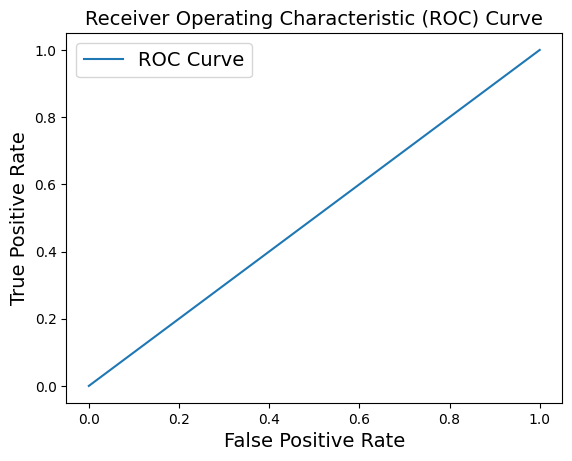

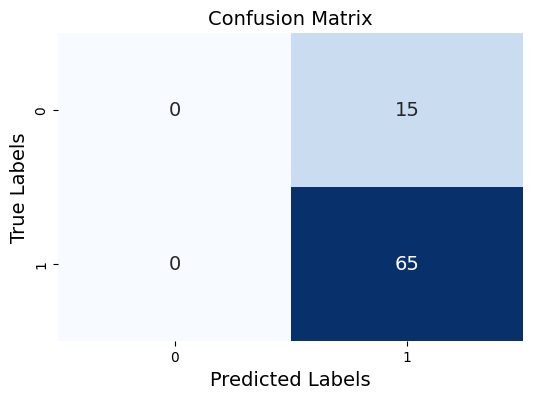

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, confusion_matrix
import numpy as np

# Define a function to evaluate a model and print its evaluation metrics
def evaluate_model(model_xception, test_data, test_labels):
    # Make predictions
    predictions = model_xception.predict(test_data)
    # Convert predictions to binary values (0 or 1)
    binary_predictions = np.round(predictions)

    # Calculate evaluation metrics
    accuracy = accuracy_score(test_labels, binary_predictions)
    precision = precision_score(test_labels, binary_predictions)
    recall = recall_score(test_labels, binary_predictions)
    f1 = f1_score(test_labels, binary_predictions)
    auc_roc = roc_auc_score(test_labels, predictions)

    # Print evaluation metrics
    print("Accuracy:", accuracy)
    print("Precision:", precision)
    print("Recall:", recall)
    print("F1 Score:", f1)
    print("AUC-ROC Score:", auc_roc)

    # Plot ROC curve
    fpr, tpr, thresholds = roc_curve(test_labels, predictions)
    plt.plot(fpr, tpr, label='ROC Curve')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend()
    plt.show()

    # Plot confusion matrix
    cm = confusion_matrix(test_labels, binary_predictions)
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt='g', cmap='Blues', cbar=False)
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.title('Confusion Matrix')
    plt.show()


# Evaluate Transfer Learning with Xception Model
print("\nEvaluation for Transfer Learning with Xception Model:")
evaluate_model(model_xception, resized_test_data, test_labels)

# **CNN + Xception Network**

In [ ]:
from keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, Reshape, UpSampling2D
from keras.models import Model
from keras.applications import Xception

# Define input shapes
frame_features_input = Input((MAX_SEQ_LENGTH, NUM_FEATURES + OPTICAL_FLOW_FEATURES + 1 + COLOR_HISTOGRAM_BINS, 1))
mask_input = Input((MAX_SEQ_LENGTH,), dtype="bool")

# CNN model
x = Conv2D(32, kernel_size=3, activation='relu', padding='same')(frame_features_input)
x = Conv2D(32, kernel_size=3, activation='relu', padding='same')(x)
x = MaxPooling2D(pool_size=2)(x)

x = Conv2D(64, kernel_size=3, activation='relu', padding='same')(x)
x = Conv2D(64, kernel_size=3, activation='relu', padding='same')(x)
x = MaxPooling2D(pool_size=2)(x)

x = Conv2D(128, kernel_size=3, activation='relu', padding='same')(x)
x = Conv2D(128, kernel_size=3, activation='relu', padding='same')(x)
x = MaxPooling2D(pool_size=2)(x)

x = Flatten()(x)
cnn_output = Dense(128, activation="relu")(x)

# Add layers to adjust the shape of the CNN output
adjusted_cnn_output = Dense(7 * 7 * 512)(cnn_output)
reshaped_cnn_output = Reshape((7, 7, 512))(adjusted_cnn_output)

# Upsample the feature maps using convolutional and upsampling layers
x = Conv2D(3, kernel_size=3, activation='relu', padding='same')(reshaped_cnn_output)
x = UpSampling2D(size=(32, 32))(x)

# Load pre-trained Xception model
xception_model = Xception(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
print(xception_model.input_shape)
# Freeze Xception layers
for layer in xception_model.layers:
    layer.trainable = False

# Pass upsampled CNN output to Xception model
xception_output = xception_model(x)

# Flatten Xception output
xception_output_flatten = Flatten()(xception_output)

# Add dense layers for classification
x = Dense(256, activation='relu')(xception_output_flatten)
x = Dense(128, activation='relu')(x)
output = Dense(1, activation='sigmoid')(x)

# Combine inputs and outputs to create the final model
model_cnn = Model(inputs=[frame_features_input, mask_input], outputs=output)

# Compile the model
model_cnn.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Print model summary
model_cnn.summary()
# Evaluate the model on the test dataset
test_loss, test_accuracy = model_cnn.evaluate([test_data[0], test_data[1]], test_labels)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)



(None, 224, 224, 3)
Model: "model_9"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_28 (InputLayer)       [(None, 20, 2562, 1)]        0         []                            
                                                                                                  
 conv2d_160 (Conv2D)         (None, 20, 2562, 32)         320       ['input_28[0][0]']            
                                                                                                  
 conv2d_161 (Conv2D)         (None, 20, 2562, 32)         9248      ['conv2d_160[0][0]']          
                                                                                                  
 max_pooling2d_25 (MaxPooli  (None, 10, 1281, 32)         0         ['conv2d_161[0][0]']          
 ng2D)                                                                  


Evaluation for the model:
3/3 [==============================] - 24s 7s/step
Accuracy: 0.8125
Precision: 0.8125
Recall: 1.0
F1 Score: 0.896551724137931
AUC-ROC Score: 0.5


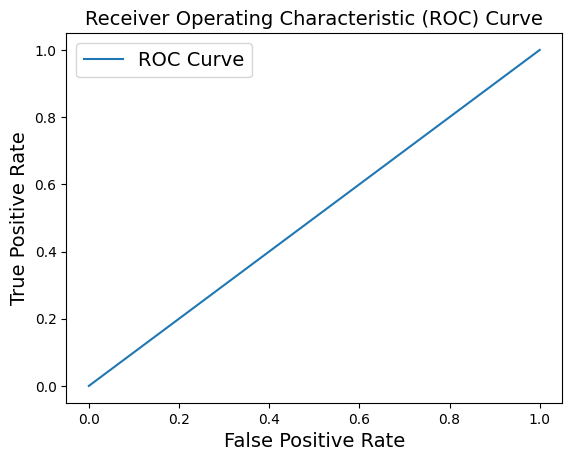

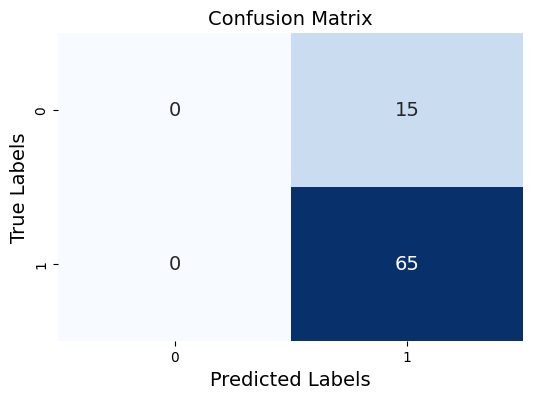

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, confusion_matrix
import numpy as np

# Define a function to evaluate a model and print its evaluation metrics
def evaluate_model(model_cnn, test_data, test_labels):
    # Make predictions
    predictions = model_cnn.predict(test_data)
    # Convert predictions to binary values (0 or 1)
    binary_predictions = np.round(predictions)

    # Calculate evaluation metrics
    accuracy = accuracy_score(test_labels, binary_predictions)
    precision = precision_score(test_labels, binary_predictions, zero_division=0)  # Set zero_division to 0
    recall = recall_score(test_labels, binary_predictions)
    f1 = f1_score(test_labels, binary_predictions)
    auc_roc = roc_auc_score(test_labels, predictions)

    # Print evaluation metrics
    print("Accuracy:", accuracy)
    print("Precision:", precision)
    print("Recall:", recall)
    print("F1 Score:", f1)
    print("AUC-ROC Score:", auc_roc)

    # Plot ROC curve
    fpr, tpr, thresholds = roc_curve(test_labels, predictions)
    plt.plot(fpr, tpr, label='ROC Curve')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend()
    plt.show()

    # Plot confusion matrix
    cm = confusion_matrix(test_labels, binary_predictions)
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt='g', cmap='Blues', cbar=False)
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.title('Confusion Matrix')
    plt.show()

# Evaluate the model
print("\nEvaluation for the model:")
evaluate_model(model_cnn, test_data, test_labels)


# **VGG16+Xception Network**

In [ ]:
from keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense
from keras.models import Model
from keras.applications import VGG16
from tensorflow.keras.utils import plot_model

# Define input shape for grayscale images
input_shape = (224, 224, 3)  # Assuming images are resized to 224x224 pixels

# Load pre-trained VGG16 model
vgg16_model = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)

# Freeze VGG16 layers
for layer in vgg16_model.layers:
    layer.trainable = False

# Define input layers
frame_features_input = Input((MAX_SEQ_LENGTH, NUM_FEATURES + OPTICAL_FLOW_FEATURES + 1 + COLOR_HISTOGRAM_BINS, 1))
mask_input = Input((MAX_SEQ_LENGTH,), dtype="bool")

# Convert grayscale input to RGB
x = Conv2D(3, kernel_size=1, activation='relu')(frame_features_input)

# Pass input through VGG16 model
vgg16_output = vgg16_model(x)

# Flatten VGG16 output
vgg16_output_flatten = Flatten()(vgg16_output)

# Add dense layers for classification
x = Dense(256, activation='relu')(vgg16_output_flatten)
x = Dense(128, activation='relu')(x)
output = Dense(1, activation='sigmoid')(x)

# Combine inputs and outputs to create the final model
model_combined = Model(inputs=[frame_features_input, mask_input], outputs=output)

# Compile the model
model_combined.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Print model summary
model_combined.summary()

# Plot the model architecture
plot_model(model_combined, to_file='model_combined.png', show_shapes=True)


ValueError: Exception encountered when calling layer 'block5_pool' (type MaxPooling2D).

Negative dimension size caused by subtracting 2 from 1 for '{{node vgg16/block5_pool/MaxPool}} = MaxPool[T=DT_FLOAT, data_format="NHWC", explicit_paddings=[], ksize=[1, 2, 2, 1], padding="VALID", strides=[1, 2, 2, 1]](vgg16/block5_conv3/Relu)' with input shapes: [?,1,160,512].

Call arguments received by layer 'block5_pool' (type MaxPooling2D):
  • inputs=tf.Tensor(shape=(None, 1, 160, 512), dtype=float32)

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, confusion_matrix
import numpy as np

# Define a function to evaluate a model and print its evaluation metrics
def evaluate_model(model_vgg, test_data, test_labels):
    # Make predictions
    predictions = model_vgg.predict(test_data)
    # Convert predictions to binary values (0 or 1)
    binary_predictions = np.round(predictions)

    # Calculate evaluation metrics
    accuracy = accuracy_score(test_labels, binary_predictions)
    precision = precision_score(test_labels, binary_predictions)
    recall = recall_score(test_labels, binary_predictions)
    f1 = f1_score(test_labels, binary_predictions)
    auc_roc = roc_auc_score(test_labels, predictions)

    # Print evaluation metrics
    print("Accuracy:", accuracy)
    print("Precision:", precision)
    print("Recall:", recall)
    print("F1 Score:", f1)
    print("AUC-ROC Score:", auc_roc)

    # Plot ROC curve
    fpr, tpr, thresholds = roc_curve(test_labels, predictions)
    plt.plot(fpr, tpr, label='ROC Curve')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend()
    plt.show()

    # Plot confusion matrix
    cm = confusion_matrix(test_labels, binary_predictions)
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt='g', cmap='Blues', cbar=False)
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.title('Confusion Matrix')
    plt.show()
# Evaluate CNN with Upsampling and Xception Integration Model
print("\nEvaluation for CNN with Upsampling and Xception Integration Model:")
evaluate_model(model_vgg, [test_data[0], test_data[1]], test_labels)

In [ ]:
def prepare_single_video(frames):
    frames = frames[None, ...]
    frame_features = Input((MAX_SEQ_LENGTH, NUM_FEATURES + OPTICAL_FLOW_FEATURES + 1 + COLOR_HISTOGRAM_BINS, 1))
    mask_input = Input((MAX_SEQ_LENGTH,), dtype="bool")

    for i, batch in enumerate(frames):
        video_length = batch.shape[0]
        length = min(MAX_SEQ_LENGTH, video_length)
        for j in range(length):
            frame_features[i, j, :] = tf.keras.backend.set_value(frame_features[i, j, :], feature_extractor.predict(batch[None, j, :]))
        mask_input[i, :length] = 1  # 1 = not masked, 0 = masked

    frame_features = frame_features.reshape((1, 65536))

    return frame_features, mask_input

def sequence_prediction(path):
    frames = load_video(os.path.join(DATA_FOLDER, TEST_FOLDER,path))
    frame_features, frame_mask = prepare_single_video(frames)
    return model.predict([frame_features, frame_mask])[0]

# This utility is for visualization.
# Referenced from:
# https://www.tensorflow.org/hub/tutorials/action_recognition_with_tf_hub
def to_gif(images):
    converted_images = images.astype(np.uint8)
    imageio.mimsave("animation.gif", converted_images, fps=10)
    return embed.embed_file("animation.gif")


test_video = np.random.choice(test_videos["video"].values.tolist())
print(f"Test video path: {test_video}")

if(sequence_prediction(test_video)>=0.5):
    print(f'The predicted class of the video is FAKE')
else:
    print(f'The predicted class of the video is REAL')

play_video(test_video,TEST_FOLDER)

Test video path: wnlubukrki.mp4
Total number of frames in the video: 300
Number of frames processed: 300
1/1 [==============================] - 0s 125ms/step


AttributeError: 'KerasTensor' object has no attribute 'assign'